In [1]:
import os
import json
from typing import Dict, List, Optional, Union, cast
import requests
from sklearn.feature_extraction.text import TfidfVectorizer
import requests
import nltk
import unicodedata
import re
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score
from acquire import scrape_github_data, headers
from env import github_token, github_username
from PIL import Image
from wordcloud import ImageColorGenerator
from prepare import basic_clean, lemmatize, remove_stopwords
import acquire

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/brandonbryant/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/brandonbryant/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [2]:
#Acquire the URLS for the Repositories to explore

headers = acquire.headers
endpoint = "https://api.github.com/search/repositories"
query = "english in:Spoken Language"
sort = "stars"
per_page = 100
order = "desc"
page = 4

#Make the request
response = requests.get(f"{endpoint}?q={query}&sort={sort}&per_page={per_page}&order={order}&page={page}", headers=headers)
payload = response.json()
payload['items']

[{'id': 12258011,
  'node_id': 'MDEwOlJlcG9zaXRvcnkxMjI1ODAxMQ==',
  'name': 'minecraft',
  'full_name': 'Luciana45/minecraft',
  'private': False,
  'owner': {'login': 'Luciana45',
   'id': 5274357,
   'node_id': 'MDQ6VXNlcjUyNzQzNTc=',
   'avatar_url': 'https://avatars.githubusercontent.com/u/5274357?v=4',
   'gravatar_id': '',
   'url': 'https://api.github.com/users/Luciana45',
   'html_url': 'https://github.com/Luciana45',
   'followers_url': 'https://api.github.com/users/Luciana45/followers',
   'following_url': 'https://api.github.com/users/Luciana45/following{/other_user}',
   'gists_url': 'https://api.github.com/users/Luciana45/gists{/gist_id}',
   'starred_url': 'https://api.github.com/users/Luciana45/starred{/owner}{/repo}',
   'subscriptions_url': 'https://api.github.com/users/Luciana45/subscriptions',
   'organizations_url': 'https://api.github.com/users/Luciana45/orgs',
   'repos_url': 'https://api.github.com/users/Luciana45/repos',
   'events_url': 'https://api.github.com

In [3]:
#Convert the reponse to a data frame
urls_df = pd.DataFrame(payload['items'])

In [4]:
#Check Dataframes shape
urls_df.shape 

(100, 75)

In [5]:
#Get a list of the full_name for the urls
urls_df.full_name.to_list()

['Luciana45/minecraft',
 'vivo-project/VIVO-languages',
 'jafl/language_game',
 'Sangarshanan/Neural-Language-Translation',
 'ELI-Data-Mining-Group/pelitk',
 'rin-nas/language-typos',
 'JonathanReeve/cenlab',
 'louisstow/Hence',
 'MegaIng/language',
 'arunism/English-to-Nepali-Language-Translation',
 'IllusionMods/KoikatsuImageTranslation',
 'Guhanxue/Speech-Rater',
 'arpitsaan/wordapp',
 'Drunkar/japanese_talk_api',
 'tedunderwood/hathimetadata',
 'scorpiodwy/MultipleLanguage',
 'spencermountain/simple_english',
 'zbgreen/NaturalLanguageShell',
 'natein/rslang',
 'TotallyPythonic/EnglishComposition',
 'appsplash99/english-to-minion-speak-translator',
 'khromov/wp-english-wp-admin',
 'l5shi/Halide_Tutorial',
 'learn-fluently/learn-fluently-ios',
 'brackendev/Readability-Objective-C',
 'accessibility/multilingual',
 'thatcherclough/Text2ASL',
 'eaydin/sylco',
 'winkjs/wink-eng-lite-model',
 'hasanTheBest/Al-Quran',
 'PabloEmidio/MultiLanguage-Dictionary',
 'BaseMax/ToyLanguageTranslator

In [6]:
#Use the scrape github function from the acquire module to acquire the dataframe containing the names of the
#repositories and the contents of the readme files
df = acquire.scrape_github_data()

#convert the data into a dataframe
df = pd.DataFrame(df)
df.head(50)

,repo,language,readme_contents
0,torvalds/linux,C,Linux kernel\n============\n\nThere are severa...
1,ansible/ansible,Python,|PyPI version| |Docs badge| |Chat badge| |Buil...
2,TensorSpeech/TensorFlowTTS,Python,"<h2 align=""center"">\n<p> :yum: TensorFlowTTS\n..."
3,plurals/pluralize,JavaScript,# Pluralize\n\n[![NPM version][npm-image]][npm...
4,vczh/tinymoe,C++,tinymoe\n=======\n### English-like programming...
5,RHVoice/RHVoice,C++,# RHVoice\n\nRHVoice is a free and open source...
6,wapmorgan/Morphos,PHP,# English\n\n* [Pluralization](#pluralization)...
7,ChenYCL/chrome-extension-udemy-translate,JavaScript,"<p align=""center"">\n <img src=""https://github..."
8,botupdate/botupdate,Common Lisp,# Botupdate\n\nThis is a dialogue-based defens...
9,VinAIResearch/BERTweet,Python,\n#### Table of contents\n1. [Introduction](...


In [7]:
#check number of rows/ columns
df.shape

(399, 3)

In [8]:
# Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 399 entries, 0 to 398
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   repo             399 non-null    object
 1   language         360 non-null    object
 2   readme_contents  399 non-null    object
dtypes: object(3)
memory usage: 9.5+ KB


In [9]:
#df stats
df.describe()

,repo,language,readme_contents
count,399,360,399
unique,394,38,381
top,shenhuanet/Ocr-android,Python,
freq,2,106,13


In [10]:
#Drop any duplicates
df = df.drop_duplicates().dropna()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 355 entries, 0 to 397
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   repo             355 non-null    object
 1   language         355 non-null    object
 2   readme_contents  355 non-null    object
dtypes: object(3)
memory usage: 11.1+ KB


# Prepare

In [11]:
#rename readdme_contents column
df = df.rename({'readme_contents':'original'},axis=1)
#apply prepare functions
df['clean'] = df.original.apply(basic_clean)
df['lemmatized'] = df.clean.apply(lemmatize)
df['stopwords_removed'] = df.lemmatized.apply(remove_stopwords)
df.head()

,repo,language,original,clean,lemmatized,stopwords_removed
0,torvalds/linux,C,Linux kernel\n============\n\nThere are severa...,linux kernel\n\n\nthere are several guides for...,linux kernel there are several guide for kerne...,linux kernel several guide kernel developer us...
1,ansible/ansible,Python,|PyPI version| |Docs badge| |Chat badge| |Buil...,pypi version docs badge chat badge build statu...,pypi version doc badge chat badge build status...,pypi version doc badge chat badge build status...
2,TensorSpeech/TensorFlowTTS,Python,"<h2 align=""center"">\n<p> :yum: TensorFlowTTS\n...",h2 aligncenter\np yum tensorflowtts\np alignce...,h2 aligncenter p yum tensorflowtts p aligncent...,h2 aligncenter p yum tensorflowtts p aligncent...
3,plurals/pluralize,JavaScript,# Pluralize\n\n[![NPM version][npm-image]][npm...,pluralize\n\nnpm versionnpmimagenpmurl\nnpm d...,pluralize npm versionnpmimagenpmurl npm downlo...,pluralize npm versionnpmimagenpmurl npm downlo...
4,vczh/tinymoe,C++,tinymoe\n=======\n### English-like programming...,tinymoe\n\n englishlike programming language\n...,tinymoe englishlike programming language for d...,tinymoe englishlike programming language dsl d...


In [12]:
all_words = ' '.join(df.stopwords_removed)
all_words

"linux kernel several guide kernel developer user guide rendered number format like html pdf please read documentationadminguidereadmerst first order build documentation use make htmldocs make pdfdocs formatted documentation also read online httpswwwkernelorgdochtmllatest various text file documentation subdirectory several using restructured text markup notation please read documentationprocesschangesrst file contains requirement building running kernel information problem may result upgrading kernel pypi version doc badge chat badge build status code conduct mailing list license cii best practice ansible ansible radically simple automation system handle configuration management application deployment cloud provisioning adhoc task execution network automation multinode orchestration ansible make complex change like zerodowntime rolling update load balancer easy information ansible website httpsansiblecom design principle deadsimple setup process minimal learning curve manage machine q

In [13]:
all_words = pd.Series(all_words.split())
all_words.value_counts().head(20)

language    1119
word         819
english      754
file         709
1            694
2            650
use          581
text         520
model        476
one          439
using        425
name         423
3            404
data         402
example      393
code         388
also         385
wa           378
run          377
install      358
dtype: int64

# Explore

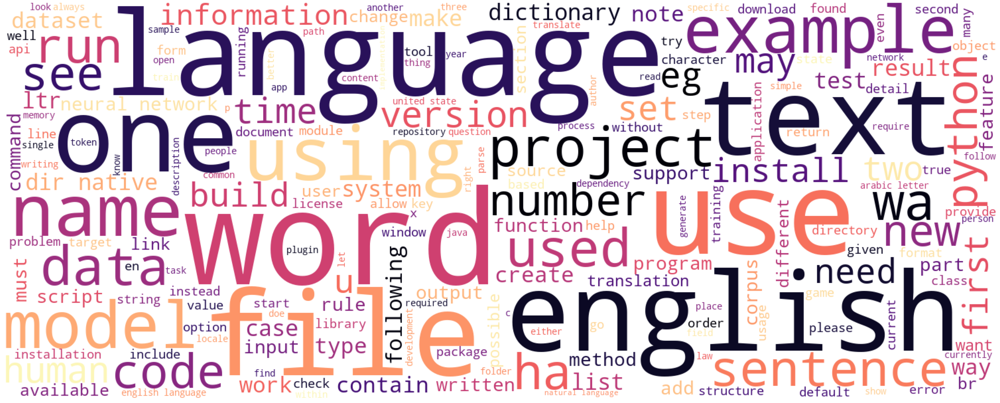

In [14]:
from wordcloud import WordCloud
all_cloud = WordCloud(background_color='white', colormap='magma', height=600, width=1500,random_state=123).generate(' '.join(all_words))
plt.figure(figsize=(100,20))
plt.axis('off')
plt.imshow(all_cloud)

In [15]:
top_20_starred_repo_bigrams = (pd.Series(nltk.ngrams(all_words, 2))
                      .value_counts()
                      .head(20))

top_20_starred_repo_bigrams

(dir, 1)                   175
(1, native)                174
(neural, network)          143
(2, 3)                     107
(english, language)         80
(united, state)             78
(3, 2)                      71
(arabic, letter)            68
(natural, language)         67
(2, 2)                      62
(pip, install)              60
('', '')                    55
(er, er)                    52
(native, '')                51
(make, sure)                47
(npm, install)              44
(2, 4)                      41
(0, 0)                      40
(programming, language)     40
(language, english)         37
dtype: int64

In [16]:
starred_repo_bigrams = top_20_starred_repo_bigrams[3:]

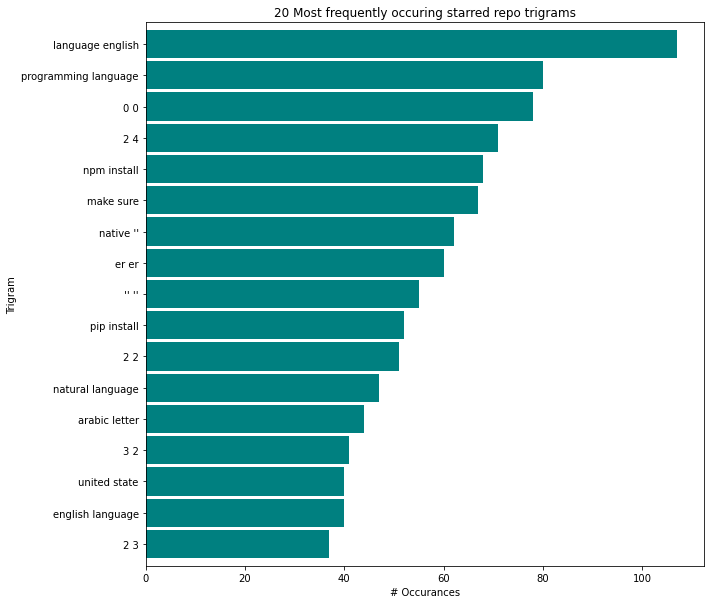

In [17]:
starred_repo_bigrams.sort_values().plot.barh(color='teal', width=.9, figsize=(10, 10))

plt.title('20 Most frequently occuring starred repo trigrams')
plt.ylabel('Trigram')
plt.xlabel('# Occurances')

# make the labels pretty
ticks, _ = plt.yticks()
labels = starred_repo_bigrams.reset_index()['index'].apply(lambda t: t[0] + ' ' + t[1])
_ = plt.yticks(ticks, labels)

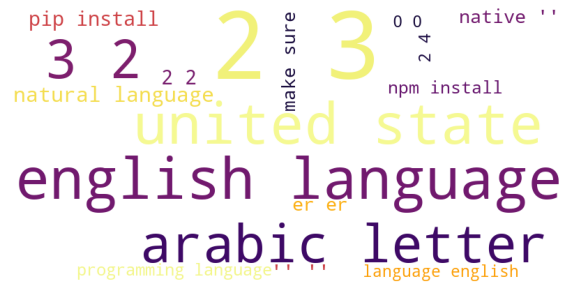

In [18]:
data = {k[0] + ' ' + k[1]: v for k, v in starred_repo_bigrams.to_dict().items()}
img = WordCloud(background_color='white',colormap='inferno', width=800, height=400).generate_from_frequencies(data)
plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.axis('off')
plt.show()

In [19]:
top_30_starred_repo_trigrams = (pd.Series(nltk.ngrams(all_words, 3))
                      .value_counts()
                     )

top_30_starred_repo_trigrams

(dir, 1, native)                    174
(2, 3, 2)                            70
('', '', '')                         45
(1, native, '')                      43
(er, er, er)                         42
                                   ... 
(problem, gui, mail)                  1
(coordination, easy, direct)          1
(athena, chrome, extension)           1
(although, recommended, disable)      1
(question, everything, trust)         1
Length: 116050, dtype: int64

In [20]:
starred_repo_trigrams = top_30_starred_repo_trigrams[20:51]

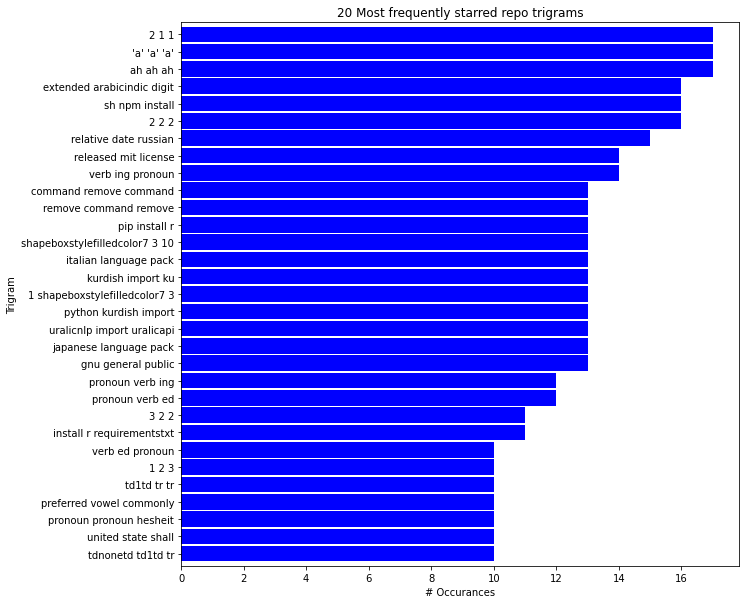

In [21]:
starred_repo_trigrams.sort_values().plot.barh(color='blue', width=.9, figsize=(10, 10))

plt.title('20 Most frequently starred repo trigrams')
plt.ylabel('Trigram')
plt.xlabel('# Occurances')

# make the labels pretty
ticks, _ = plt.yticks()
labels = starred_repo_trigrams.reset_index()['index'].apply(lambda t: t[0] + ' ' + t[1] + ' ' + t[2])
_ = plt.yticks(ticks, labels)

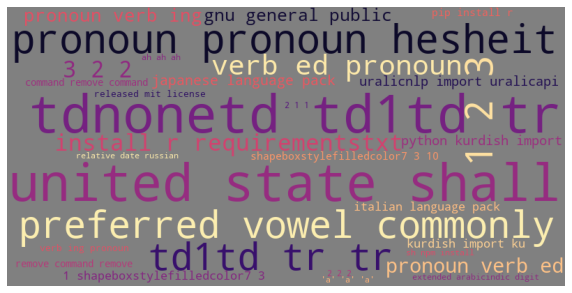

In [22]:
data = {k[0] + ' ' + k[1] + ' ' + k[2]: v for k, v in starred_repo_trigrams.to_dict().items()}
img = WordCloud(background_color='grey', colormap='magma', width=800, height=400).generate_from_frequencies(data)
plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.axis('off')
plt.show()

In [23]:
top_20_starred_repo_trigrams = (pd.Series(nltk.ngrams(all_words, 3))
                      .value_counts()
                     )
top_20_starred_repo_trigrams

(dir, 1, native)                    174
(2, 3, 2)                            70
('', '', '')                         45
(1, native, '')                      43
(er, er, er)                         42
                                   ... 
(problem, gui, mail)                  1
(coordination, easy, direct)          1
(athena, chrome, extension)           1
(although, recommended, disable)      1
(question, everything, trust)         1
Length: 116050, dtype: int64

In [24]:
df.language.value_counts().head()

Python              104
JavaScript           54
Java                 30
Jupyter Notebook     30
PHP                  21
Name: language, dtype: int64

In [25]:
python = df[df.language == 'Python']
javascript = df[df.language == 'JavaScript']
java = df[df.language == 'Java']
jupyter_notebook = df[df.language == 'Jupyter Notebook']
php = df[df.language == 'PHP']

In [26]:
python_words = ' '.join(python.stopwords_removed)
javascript_words = ' '.join(javascript.stopwords_removed)
java_words = ' '.join(java.stopwords_removed)
jupyter_notebook_words = ' '.join(jupyter_notebook.stopwords_removed)
php_words = ' '.join(php.stopwords_removed)

In [27]:
python_freq = pd.Series(python_words.split()).value_counts()
python_freq.head()

language    402
model       309
word        305
english     299
python      255
dtype: int64

In [28]:
javascript_freq = pd.Series(javascript_words.split()).value_counts()
javascript_freq.head()

1         222
name      222
native    195
dir       185
ltr       175
dtype: int64

In [29]:
java_freq = pd.Series(java_words.split()).value_counts()
java_freq.head()

pronoun     89
er          67
verb        57
language    52
img         52
dtype: int64

In [30]:
jupyter_notebook_freq = pd.Series(jupyter_notebook_words.split()).value_counts()
jupyter_notebook_freq.head()

key         86
model       81
language    76
english     59
finger      57
dtype: int64

In [31]:
php_freq = pd.Series(java_words.split()).value_counts()
php_freq.head()

pronoun     89
er          67
verb        57
language    52
img         52
dtype: int64

In [32]:
all_words = python_words + javascript_words + java_words + jupyter_notebook_words + php_words

In [33]:
all_freq = pd.Series(all_words.split()).value_counts()

In [34]:
word_counts = (pd.concat([all_freq,python_freq,javascript_freq,java_freq,jupyter_notebook_freq,php_freq], axis=1, sort=True)
                .set_axis(['All','Python','Javascript','Java','Jupyter Notebook','PHP'], axis=1, inplace=False)
                .fillna(0)
                .apply(lambda s: s.astype(int)))

word_counts.head()

,All,Python,Javascript,Java,Jupyter Notebook,PHP
',62,28,20,0,6,0
'',161,78,69,0,4,0
''''',1,1,0,0,0,0
''''''''''''',1,1,0,0,0,0
'''sereleskar,1,1,0,0,0,0


In [35]:
word_counts.sort_values(by='All', ascending=False).head(10)

,All,Python,Javascript,Java,Jupyter Notebook,PHP
language,786,402,136,52,76,52
english,529,299,83,39,59,39
word,475,305,50,17,41,17
1,465,156,222,13,37,13
model,425,309,21,9,81,9
file,350,217,44,50,16,50
use,350,177,59,38,38,38
text,317,214,22,11,34,11
name,300,40,222,9,8,9
2,284,132,33,16,33,16


Text(0.5, 1.0, 'Proportion of programming languages for the 20 most common words')

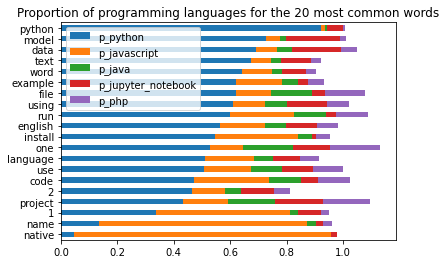

In [36]:
(word_counts
 .assign(p_python=word_counts['Python'] / word_counts['All'],
         p_javascript=word_counts.Javascript / word_counts['All'],
         p_java=word_counts.Java / word_counts['All'],
         p_jupyter_notebook=word_counts['Jupyter Notebook'] / word_counts['All'],
         p_php=word_counts.PHP / word_counts['All'])
 .sort_values(by='All')
 [['p_python', 'p_javascript','p_java','p_jupyter_notebook','p_php']]
 .tail(20)
 .sort_values('p_python')
 .plot.barh(stacked=True))

plt.title('Proportion of programming languages for the 20 most common words')

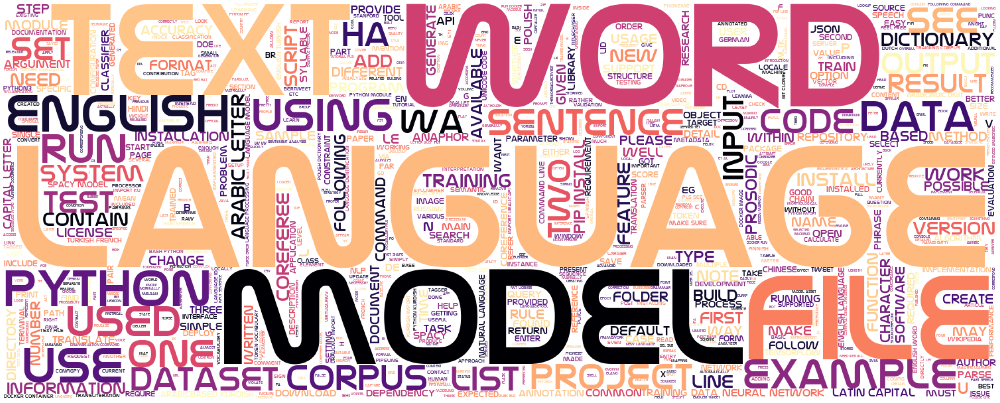

In [37]:
font_path = 'nasalization_rg.ttf'
python_cloud = WordCloud(max_words=None,font_path=font_path,background_color='white', colormap='magma', height=600, width=1500,random_state=123).generate(python_words)
plt.figure(figsize=(100,20))
plt.axis('off')
plt.imshow(python_cloud)

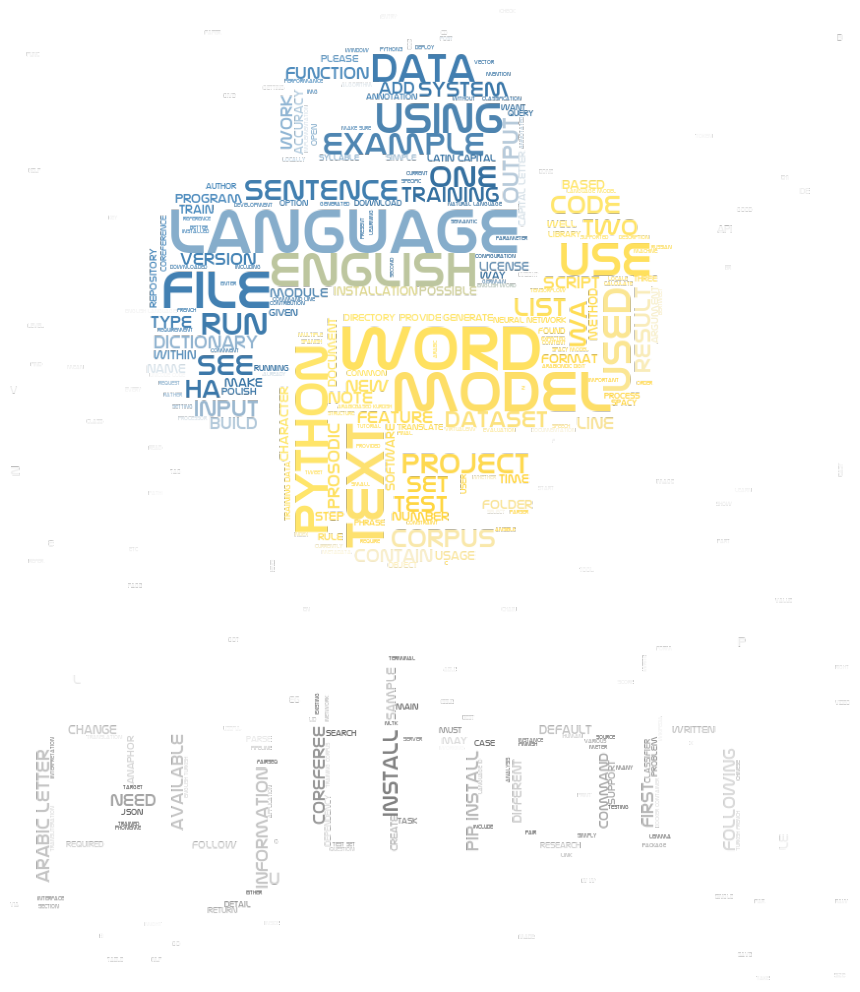

In [38]:
mask = np.array(Image.open('python_logo.png'))
mask_colors = ImageColorGenerator(mask)
python_cloud = WordCloud(mask=mask,
                         width=mask.shape[1],
                         height=mask.shape[0],
                         max_words=5000,
                         font_path=font_path,
                         background_color=None,
                         mode='RGBA',
                         color_func=mask_colors,
                         random_state=45                         
                         ).generate(python_words)
plt.figure(figsize=(100, 18))
plt.axis('off')
plt.imshow(python_cloud)

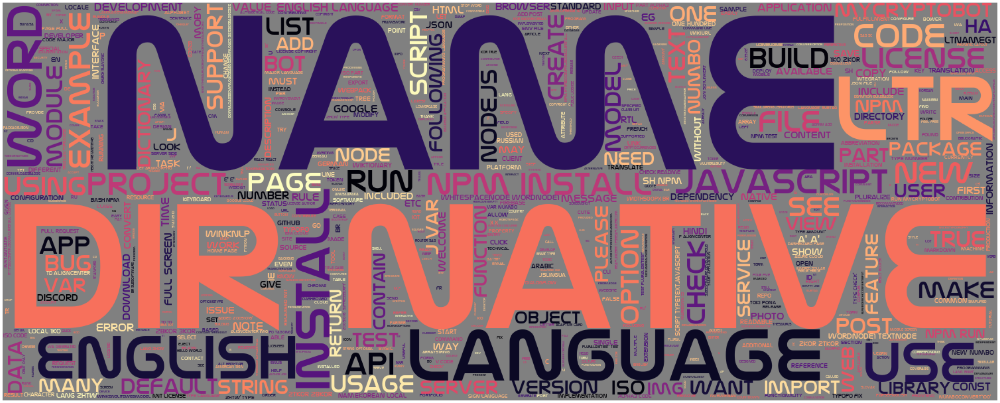

In [39]:
font_path = 'nasalization_rg.ttf'
javascript_cloud = WordCloud(max_words=None,font_path=font_path,background_color='grey', colormap='magma', height=600, width=1500,random_state=123).generate(javascript_words)
plt.figure(figsize=(100,20))
plt.axis('off')
plt.imshow(javascript_cloud)

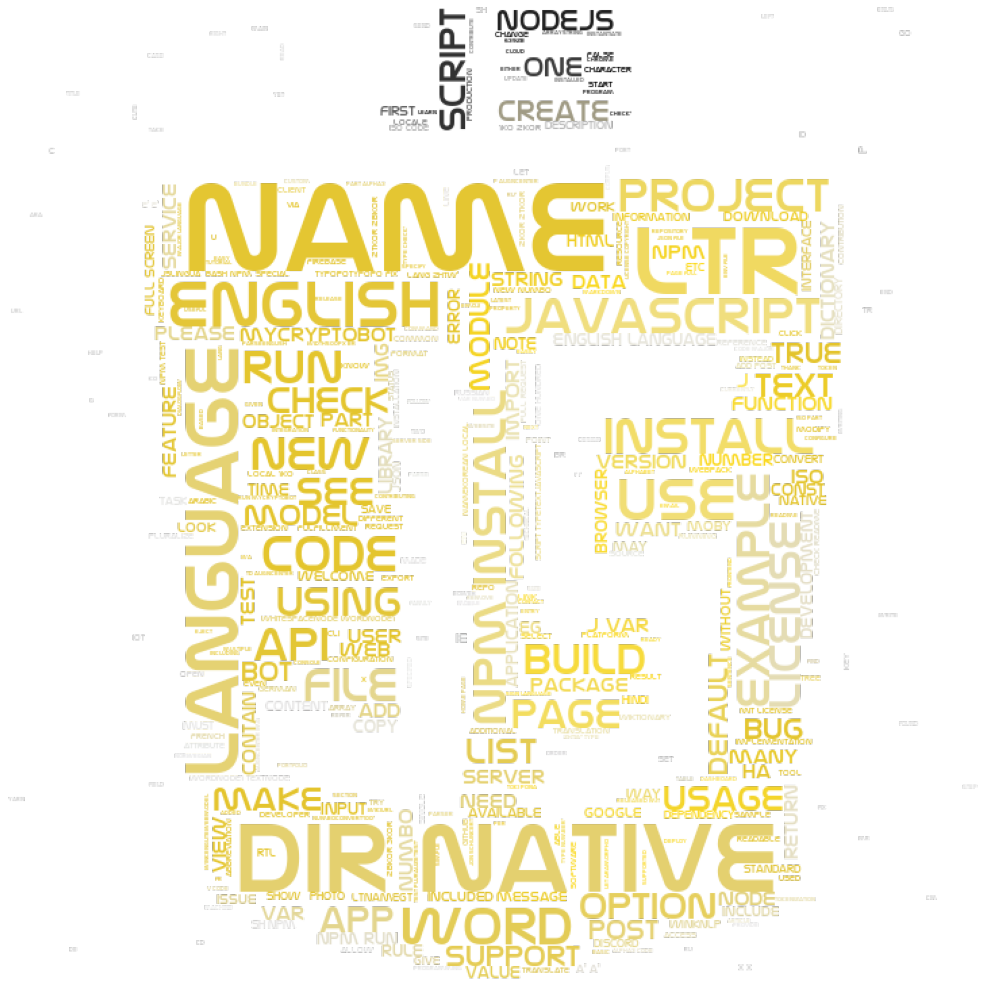

In [40]:
mask = np.array(Image.open('javascript_logo.jpg'))
mask_colors = ImageColorGenerator(mask)
javascript_cloud = WordCloud(mask=mask,
                         width=mask.shape[1],
                         height=mask.shape[0],
                         max_words=5000,
                         font_path=font_path,
                         background_color=None,
                         mode='RGBA',
                         color_func=mask_colors,
                         random_state=45                         
                         ).generate(javascript_words)
plt.figure(figsize=(100, 18))
plt.axis('off')
plt.imshow(javascript_cloud)

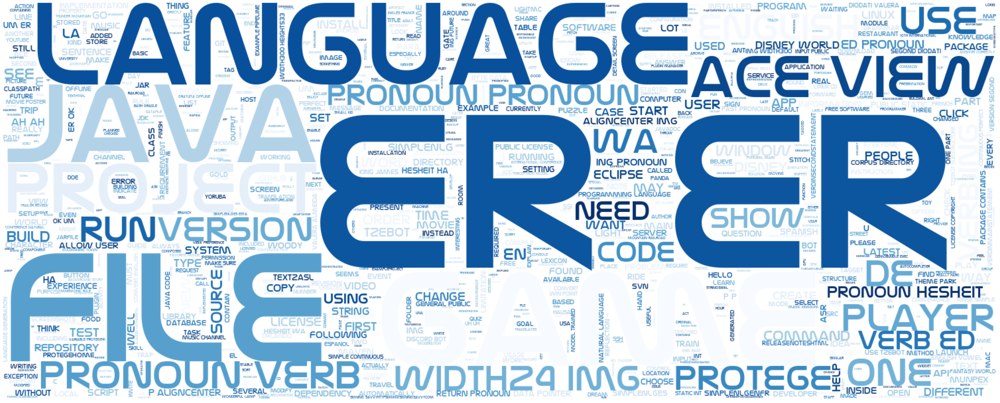

In [41]:
font_path = 'nasalization_rg.ttf'
java_cloud = WordCloud(max_words=None,font_path=font_path,background_color='white', colormap='Blues', height=600, width=1500,random_state=123).generate(java_words)
plt.figure(figsize=(100,20))
plt.axis('off')
plt.imshow(java_cloud)

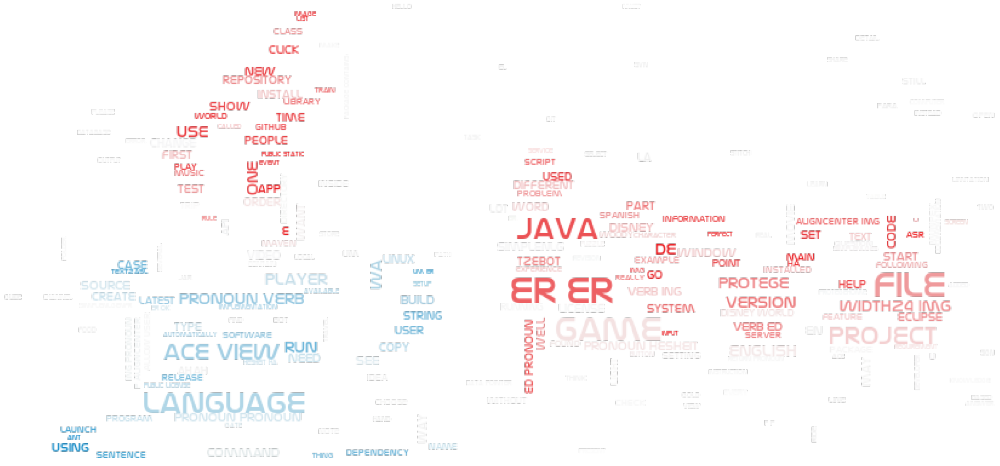

In [42]:
mask = np.array(Image.open('java_logo.jpg'))
mask_colors = ImageColorGenerator(mask)
java_cloud = WordCloud(mask=mask,
                         width=mask.shape[1],
                         height=mask.shape[0],
                         max_words=5000,
                         font_path=font_path,
                         background_color=None,
                         mode='RGBA',
                         color_func=mask_colors,
                         random_state=45                         
                         ).generate(java_words)
plt.figure(figsize=(100, 18))
plt.axis('off')
plt.imshow(java_cloud)

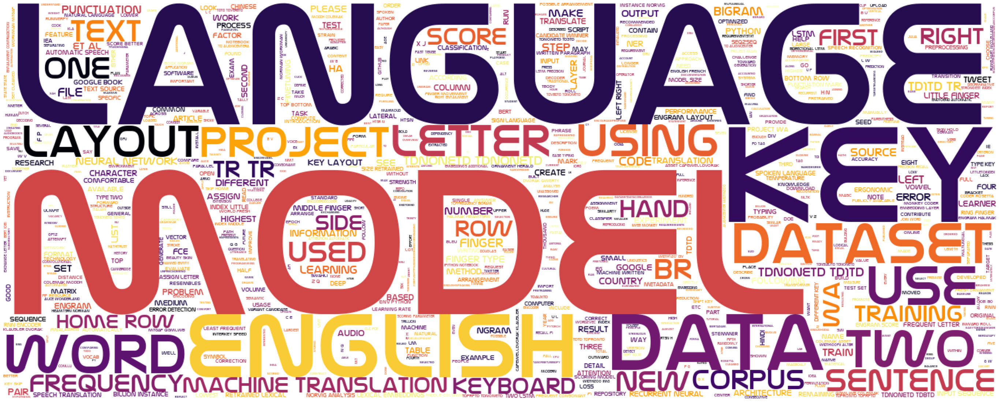

In [43]:
font_path = 'nasalization_rg.ttf'
jupyter_notebook_cloud = WordCloud(max_words=None,font_path=font_path,background_color='white', colormap='inferno', height=600, width=1500,random_state=123).generate(jupyter_notebook_words)
plt.figure(figsize=(100,20))
plt.axis('off')
plt.imshow(jupyter_notebook_cloud)

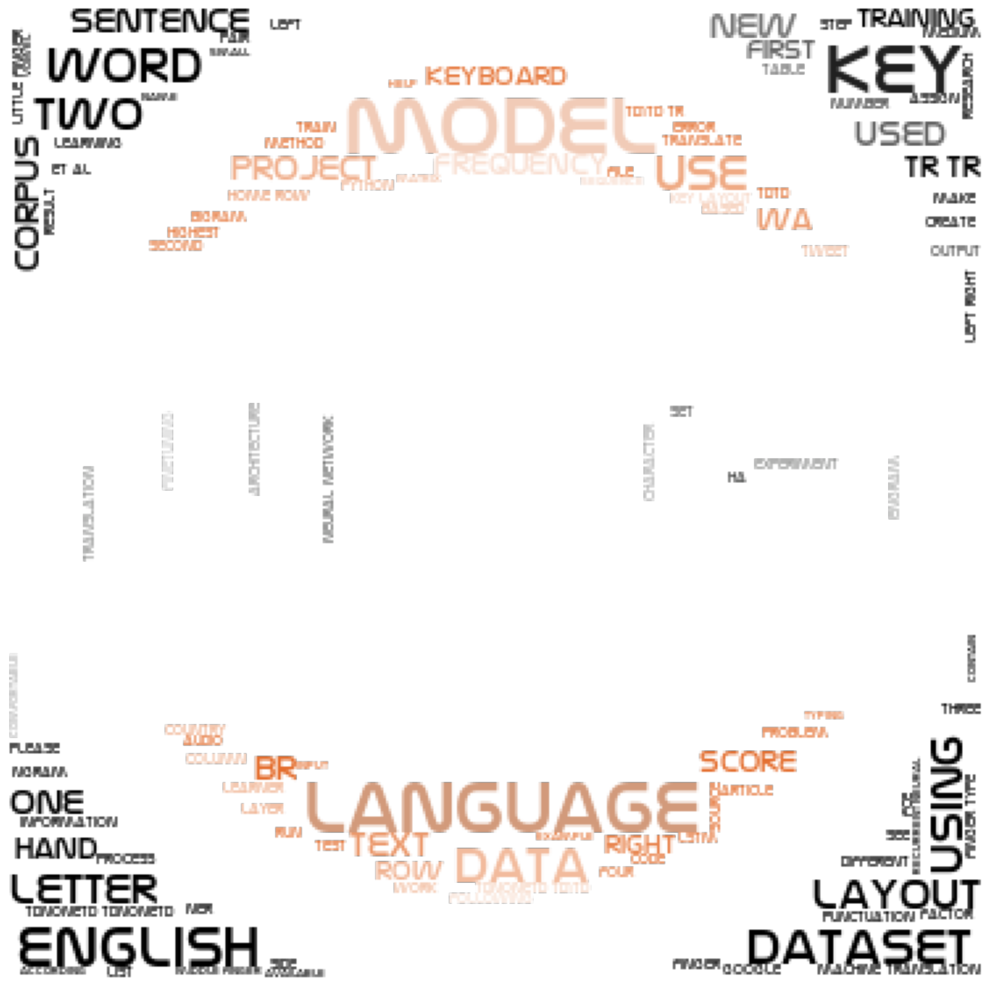

In [44]:
mask = np.array(Image.open('jupyter_notebook_logo.png'))
mask_colors = ImageColorGenerator(mask)
jupyter_notebook_cloud = WordCloud(mask=mask,
                         width=mask.shape[1],
                         height=mask.shape[0],
                         max_words=5000,
                         font_path=font_path,
                         background_color=None,
                         mode='RGBA',
                         color_func=mask_colors,
                         random_state=45                         
                         ).generate(jupyter_notebook_words)
plt.figure(figsize=(100, 18))
plt.axis('off')
plt.imshow(jupyter_notebook_cloud)

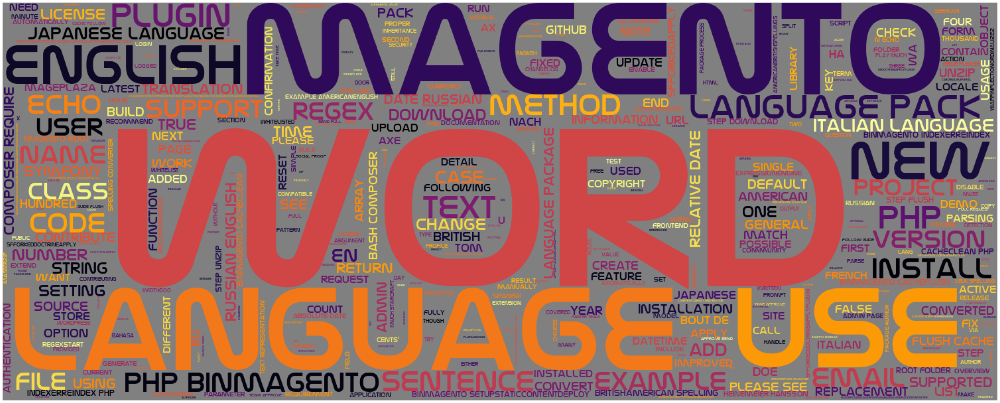

In [45]:
font_path = 'nasalization_rg.ttf'
php_cloud = WordCloud(max_words=None,font_path=font_path,background_color='grey', colormap='inferno', height=600, width=1500,random_state=123).generate(php_words)
plt.figure(figsize=(100,20))
plt.axis('off')
plt.imshow(php_cloud)

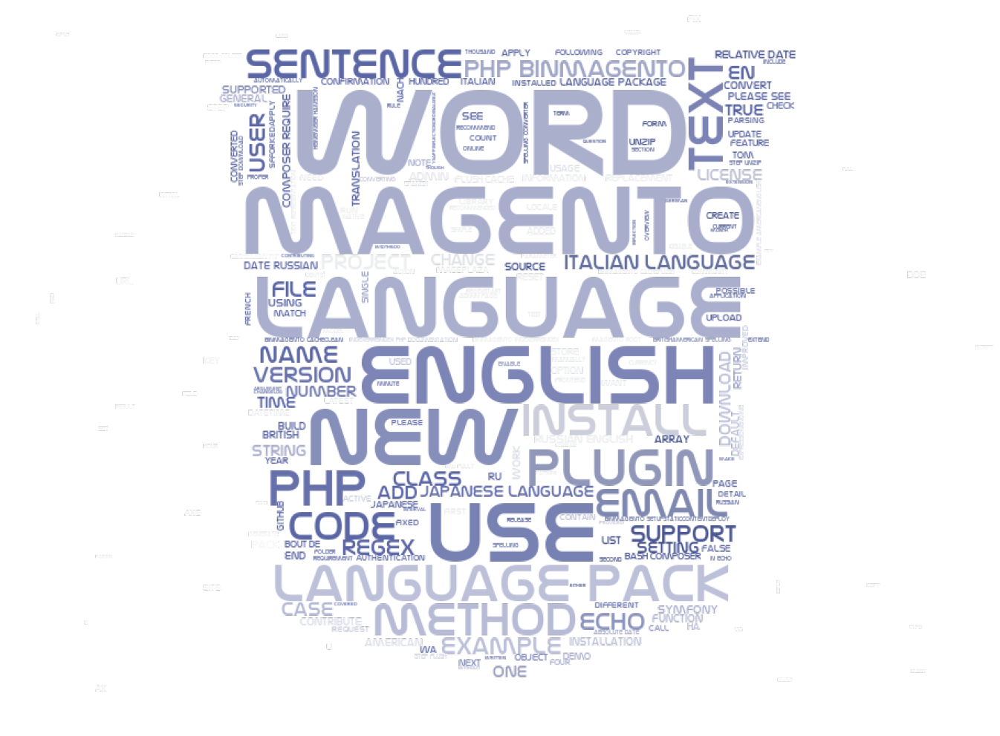

In [46]:
mask = np.array(Image.open('php_logo.png'))
mask_colors = ImageColorGenerator(mask)
php_cloud = WordCloud(mask=mask,
                         width=mask.shape[1],
                         height=mask.shape[0],
                         max_words=5000,
                         font_path=font_path,
                         background_color=None,
                         mode='RGBA',
                         color_func=mask_colors,
                         random_state=45                         
                         ).generate(php_words)
plt.figure(figsize=(100, 18))
plt.axis('off')
plt.imshow(php_cloud)

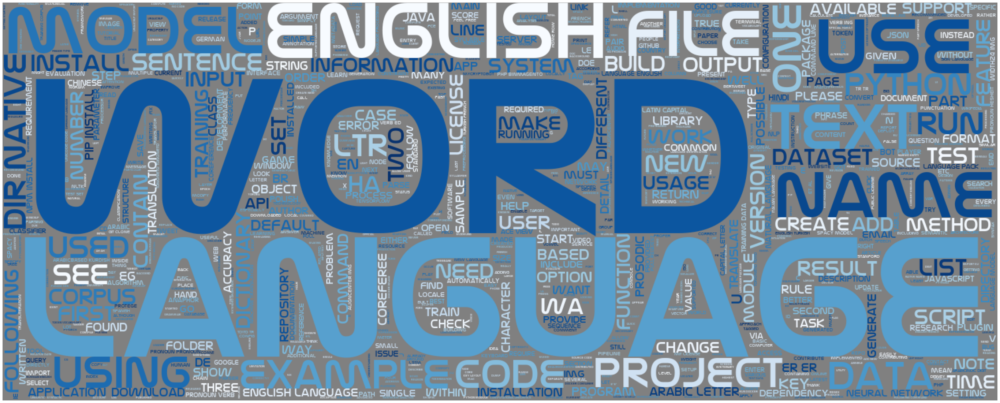

In [47]:
font_path = 'nasalization_rg.ttf'
all_cloud = WordCloud(max_words=None,font_path=font_path,background_color='grey', colormap='Blues', height=600, width=1500,random_state=123).generate(all_words)
plt.figure(figsize=(100,20))
plt.axis('off')
plt.imshow(all_cloud)

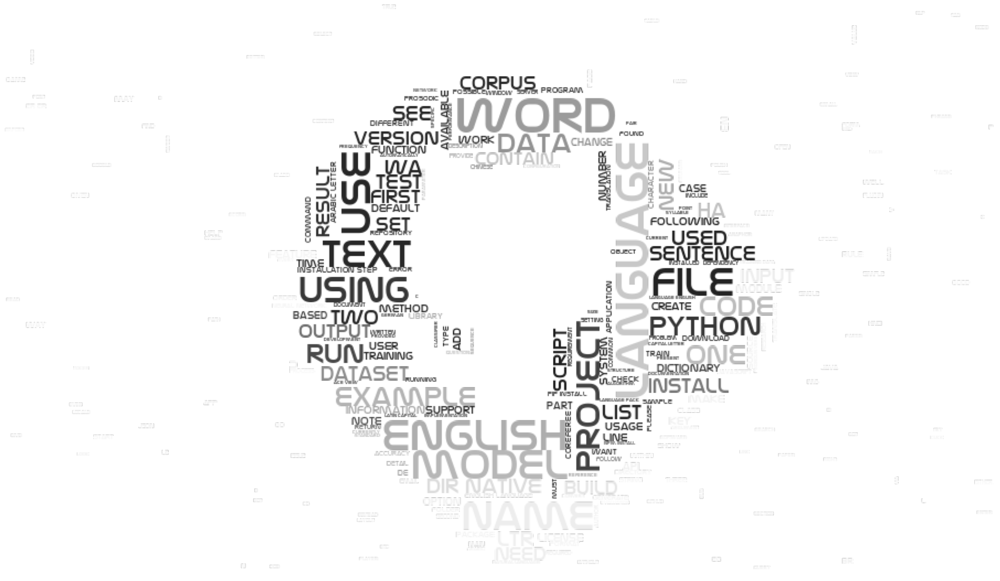

In [48]:
mask = np.array(Image.open('github_logo.jpg'))
mask_colors = ImageColorGenerator(mask)
all_cloud = WordCloud(mask=mask,
                         width=mask.shape[1],
                         height=mask.shape[0],
                         max_words=5000,
                         font_path=font_path,
                         background_color=None,
                         mode='RGBA',
                         color_func=mask_colors,
                         random_state=45                         
                         ).generate(all_words)
plt.figure(figsize=(100, 18))
plt.axis('off')
plt.imshow(all_cloud)

# Modeling

In [49]:
df.language.value_counts()

Python                   104
JavaScript                54
Java                      30
Jupyter Notebook          30
PHP                       21
HTML                      16
Ruby                      12
C++                       11
C                          9
Go                         8
Swift                      6
C#                         6
TeX                        5
Shell                      4
TypeScript                 4
CSS                        3
Objective-C                3
Kotlin                     3
Common Lisp                3
PowerShell                 2
Rust                       2
Dart                       2
Smalltalk                  2
Lex                        1
PLpgSQL                    1
Scala                      1
Grammatical Framework      1
Vue                        1
Roff                       1
OpenEdge ABL               1
Perl                       1
Emacs Lisp                 1
R                          1
XQuery                     1
FreeMarker    

In [50]:
top_5_languages = ['Python','JavaScript','Jupyter Notebook','Java','PHP']

In [51]:
df2 = df[df.language.isin(top_5_languages)][['repo','language','stopwords_removed']]
df2.head()

,repo,language,stopwords_removed
1,ansible/ansible,Python,pypi version doc badge chat badge build status...
2,TensorSpeech/TensorFlowTTS,Python,h2 aligncenter p yum tensorflowtts p aligncent...
3,plurals/pluralize,JavaScript,pluralize npm versionnpmimagenpmurl npm downlo...
6,wapmorgan/Morphos,PHP,english pluralizationpluralization numeralsnum...
7,ChenYCL/chrome-extension-udemy-translate,JavaScript,p aligncenter img srchttpsgithubcomchenyclchro...


In [52]:
from prepare import split
from sklearn.model_selection import train_test_split

In [53]:
train, validate, test = split(df2,'language')
train.head()

,repo,language,stopwords_removed
102,shenhuanet/Ocr-android,Java,ocrandroid httpsjitpackiovshenhuanetocrandroid...
55,chrisjbryant/lmgec-lite,Python,lmgeclite repository contains language model b...
59,notAI-tech/DeepTranslit,Python,deeptranslit towards better transliteration in...
125,mageplaza/magento-2-italian-language-pack,PHP,magento 2 italian language pack magento 2 ital...
182,cetinsamet/pos-tagging,Python,postagger implementation partofspeech tagger e...


In [54]:
# Setup our X variables
X_train = train.stopwords_removed
X_validate = validate.stopwords_removed
X_test = test.stopwords_removed

In [55]:
# Setup our y variables
y_train = train.language
y_validate = validate.language
y_test = test.language

In [56]:
X_train.head()

102    ocrandroid httpsjitpackiovshenhuanetocrandroid...
55     lmgeclite repository contains language model b...
59     deeptranslit towards better transliteration in...
125    magento 2 italian language pack magento 2 ital...
182    postagger implementation partofspeech tagger e...
Name: stopwords_removed, dtype: object

In [57]:
# Create the tfidf vectorizer object
# Step 1, this creates a tf-idf values for each word, for each document
# Step 2, encodes these values so that we can use models that only work on numbers, like classifications model
tfidf = TfidfVectorizer()

# Fit on the training data
tfidf.fit(X_train)

# Use the object
X_train_vectorized = tfidf.transform(X_train)
X_validate_vectorized = tfidf.transform(X_validate)
X_test_vectorized = tfidf.transform(X_test)

In [58]:
X_train_vectorized.todense().shape

(133, 10655)

In [59]:
# Now that we have a vectorized dataset, we can use our classification tools!
lm = LogisticRegression(class_weight='balanced',solver='liblinear',random_state=123)

# Fit the classification model on our vectorized train data
lm.fit(X_train_vectorized, y_train)

LogisticRegression(class_weight='balanced', random_state=123,
                   solver='liblinear')

In [60]:
train = pd.DataFrame(dict(actual=y_train))
validate = pd.DataFrame(dict(actual=y_validate))
test = pd.DataFrame(dict(actual=y_test))

In [61]:
# Use the trained model to predict y given those vectorized inputs of X
train['predicted'] = lm.predict(X_train_vectorized)
validate["predicted"] = lm.predict(X_validate_vectorized)
test['predicted'] = lm.predict(X_test_vectorized)

In [62]:
train.head()

,actual,predicted
102,Java,Java
55,Python,Python
59,Python,Python
125,PHP,PHP
182,Python,Python


In [63]:
# Train Accuracy
(train.actual == train.predicted).mean()

0.9699248120300752

In [64]:
# Out of sample accuracy
(validate.actual == validate.predicted).mean()

0.5689655172413793

In [65]:
#from sklearn.metrics import classification_report
print(classification_report(train.actual, train.predicted))

                  precision    recall  f1-score   support

            Java       1.00      0.94      0.97        16
      JavaScript       1.00      1.00      1.00        30
Jupyter Notebook       1.00      0.88      0.94        17
             PHP       1.00      0.92      0.96        12
          Python       0.94      1.00      0.97        58

        accuracy                           0.97       133
       macro avg       0.99      0.95      0.97       133
    weighted avg       0.97      0.97      0.97       133



In [66]:
test

,actual,predicted
241,Python,Python
370,PHP,PHP
208,Java,Java
312,Python,Python
254,Python,Python
211,JavaScript,Python
37,JavaScript,JavaScript
342,Python,Python
100,Python,Python
274,Python,Python


In [67]:
print(classification_report(validate.actual, validate.predicted))

                  precision    recall  f1-score   support

            Java       1.00      0.12      0.22         8
      JavaScript       1.00      0.46      0.63        13
Jupyter Notebook       1.00      0.14      0.25         7
             PHP       0.00      0.00      0.00         5
          Python       0.50      1.00      0.67        25

        accuracy                           0.57        58
       macro avg       0.70      0.35      0.35        58
    weighted avg       0.70      0.57      0.49        58



/usr/local/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [68]:
print(classification_report(test.actual, test.predicted))

                  precision    recall  f1-score   support

            Java       1.00      0.17      0.29         6
      JavaScript       1.00      0.36      0.53        11
Jupyter Notebook       0.00      0.00      0.00         6
             PHP       1.00      0.50      0.67         4
          Python       0.51      1.00      0.68        21

        accuracy                           0.58        48
       macro avg       0.70      0.41      0.43        48
    weighted avg       0.66      0.58      0.51        48



In [7]:
null_readme = df[df['readme_contents'].isnull()].index

In [8]:
type(null_readme)

pandas.core.indexes.numeric.Int64Index

In [9]:
df.drop(null_readme , inplace=True)

In [10]:
df.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 399 entries, 0 to 398
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   repo             399 non-null    object
 1   language         360 non-null    object
 2   readme_contents  399 non-null    object
dtypes: object(3)
memory usage: 12.5+ KB


In [16]:
import numpy as np
import bs4
import time

from sklearn.feature_extraction.text import TfidfVectorizer
import nltk
import unicodedata
import re

import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score

from textblob import TextBlob


In [17]:

df.readme_contents = df.readme_contents.apply(clean)

In [18]:
df.head()

,repo,language,readme_contents
0,torvalds/linux,C,linux kernel several guide kernel developer us...
1,ansible/ansible,Python,pypi version doc badge chat badge build status...
2,TensorSpeech/TensorFlowTTS,Python,h2 aligncenter p yum tensorflowtts p aligncent...
3,plurals/pluralize,JavaScript,pluralize npm versionnpmimagenpmurl npm downlo...
4,vczh/tinymoe,C++,tinymoe englishlike programming language dsl d...


In [19]:

text = TextBlob(df.readme_contents[2])

In [20]:
text.detect_language()

'en'

In [21]:
df.readme_contents[3]

'pluralize npm versionnpmimagenpmurl npm downloadsdownloadsimagedownloadsurl build statustravisimagetravisurl test coveragecoverallsimagecoverallsurl file sizefilesizeurl cdnjscdnjsimagecdnjsurl pluralize singularize word installation npm install pluralize save yarn add pluralize bower install pluralize save node javascript var pluralize requirepluralize amd javascript definefunction require export module var pluralize requirepluralize script tag html script srcpluralizejsscript module u predefined list rule applied order singularize pluralize given word many case useful automation based user input application word known ahead time use simple ternary function would much lighter alternative usage word string word pluralize count number many word exist inclusive boolean whether prefix number eg 3 duck example javascript pluralizetest test pluralizetest 0 test pluralizetest 1 test pluralizetest 5 test pluralizetest 1 true 1 test pluralizetest 5 true 5 test pluralize true example new plura

In [23]:
df.head()

,repo,language,readme_contents
0,torvalds/linux,C,linux kernel several guide kernel developer us...
1,ansible/ansible,Python,pypi version doc badge chat badge build status...
2,TensorSpeech/TensorFlowTTS,Python,h2 aligncenter p yum tensorflowtts p aligncent...
3,plurals/pluralize,JavaScript,pluralize npm versionnpmimagenpmurl npm downlo...
4,vczh/tinymoe,C++,tinymoe englishlike programming language dsl d...


In [24]:
df.repo.value_counts()


Vedenin/code-for-learning-languages                 2
SuzanaK/english_synonyms_antonyms_list              2
shenhuanet/Ocr-android                              2
anuragk240/Speech-to-Sign-Language-Translator       2
musicamecclesiae/English-Hymns                      2
                                                   ..
microsoft/LID-tool                                  1
HegdeChaitra/machine_translation                    1
asweigart/simple-turtle-tutorial-for-python         1
surfinzap/typopo                                    1
shvmshukla/Machine-Translation-Hindi-to-english-    1
Name: repo, Length: 394, dtype: int64

In [25]:
df.language.value_counts()

Python                   106
JavaScript                54
Java                      32
Jupyter Notebook          30
PHP                       21
HTML                      16
Ruby                      12
C++                       11
C                          9
Go                         8
Swift                      6
C#                         6
TeX                        5
TypeScript                 4
Shell                      4
CSS                        3
Objective-C                3
Kotlin                     3
Common Lisp                3
Rust                       2
Smalltalk                  2
Dart                       2
PowerShell                 2
LilyPond                   2
VimL                       1
Grammatical Framework      1
Vue                        1
R                          1
Emacs Lisp                 1
FreeMarker                 1
PLpgSQL                    1
Perl                       1
XQuery                     1
Lex                        1
Scala         

In [27]:
df.readme_contents.value_counts()

In [30]:
df[df.language == 'Java'].shape

(32, 3)

In [ ]:
df[df.language == 'Java'].shape